In [1]:
import os
    
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

In [2]:
def printImgs(images,lsNames,lsValPSNR, n=1, m=1, title='',k=0):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    i=0
    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax.set_title(lsName)
        if i>k:
            ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)
        i=i+1    
    plt.savefig(title)    
    plt.show()


def printAng(images,lsNames,lsValPSNR, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )

    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(image)
        ax.set_title(lsName)
        ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)   
    plt.savefig(title)    
    plt.show()
    
    

def printGrafs(images, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(18, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    for ax, image in zip(axs.flat, images):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.savefig(title)    
    plt.show()

In [3]:
### DIP - VTV - GradRimm - Dirac
lsNumPrue = ['340','342','350','341B']
lambAsLS = ['0','0.0001','0.0001','0.0001']
typeP = 'debU'

kodim_num_i = 13

In [4]:
lsBestImg = []
    
ruta = './IMG_RES/IMGkodim'+ str(kodim_num_i) +'/'

os.makedirs(ruta)

#original
namefig = './deblurring/kodim'+ str(kodim_num_i) + '_small.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'kodim'+ str(kodim_num_i) +'_small.png'
cv2.imwrite(filename, imgOut)

#denoisig25
namefig = './deblurring/kodim'+ str(kodim_num_i) + '_small_blurred_uniform.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'kodim'+ str(kodim_num_i) + '_small_blurred_uniform.png'
cv2.imwrite(filename, imgOut)

for Nprueb,lambAs in zip(lsNumPrue,lambAsLS):
    
    ruta = './'+ Nprueb +'/BestPnsr'+ typeP + '_P'+ Nprueb +'lamb'+ lambAs +'/'
    namefig = ruta + 'BestPnsr'+ typeP +'_P'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'_small.png'
    imgOut = cv2.imread(namefig)
    lsBestImg.append(imgOut)
    
    filename = ruta + 'BestIMGP'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    cv2.imwrite(filename, imgOut)

In [5]:
filename

'./341B/BestPnsrdebU_P341Blamb0.0001/BestIMGP341B_0.0001kodim13.png'

In [6]:
imgOut.shape

(256, 384, 3)

In [7]:
namefig

'./341B/BestPnsrdebU_P341Blamb0.0001/BestPnsrdebU_P341B_0.0001kodim13_small.png'

In [8]:
#BestPnsrdebU_P350_0.0001kodim19_small

In [9]:
lsNames = ['Downsampling','Downsampling + Blur','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

In [10]:
from skimage.metrics import peak_signal_noise_ratio as compare_psnr

lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

/home/linux21/miniconda3/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:163: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


In [11]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.09432772056295, 23.735353665592914, 24.184756906722523, 24.122444824920983, 24.224897988355707]
24.224897988355707
5


In [12]:
lsValPSNR

[inf,
 20.09432772056295,
 23.735353665592914,
 24.184756906722523,
 24.122444824920983,
 24.224897988355707]

In [13]:
#round(np.array(lsValPSNR),3)
num="{:.2f}".format(lsValPSNR[0])

In [14]:
lsValPSNR[0] = 0

In [15]:
#lsValPSNR = [' ','20.321','28,247','29,111','29,306','29,400']

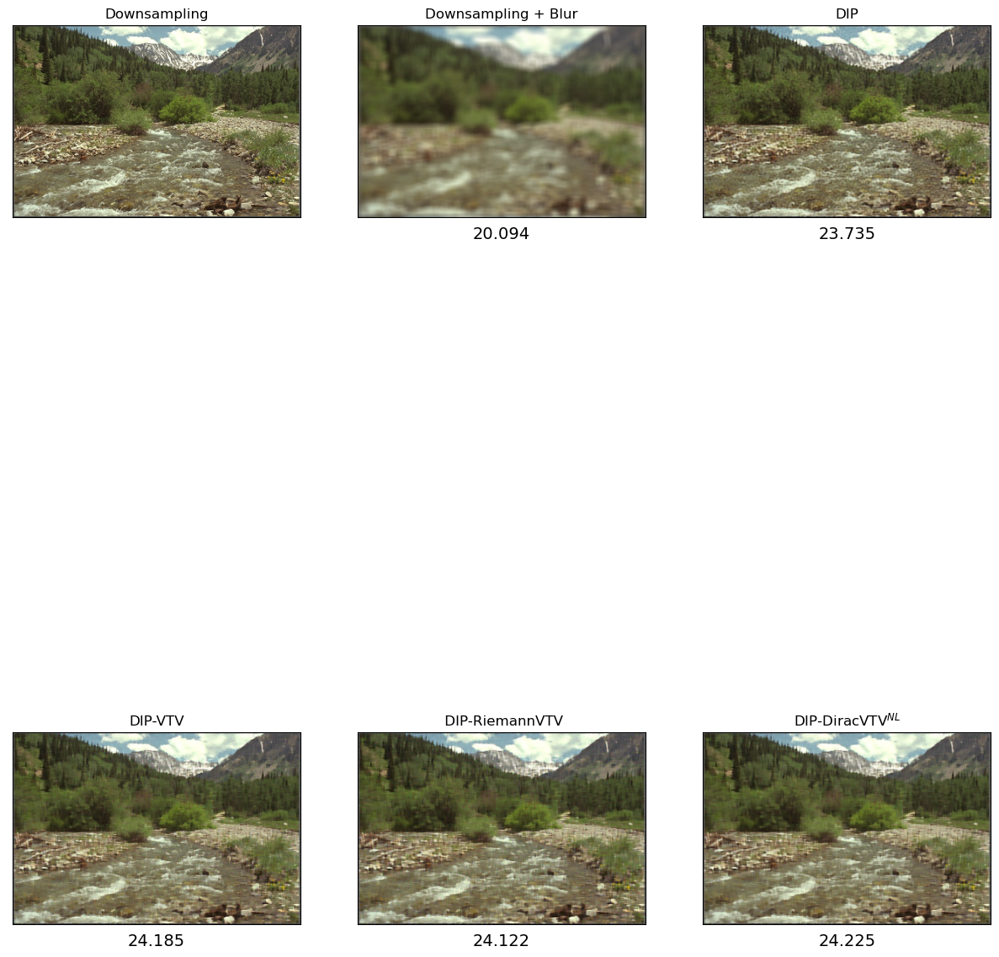

In [16]:
titulo = 'ComImg'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsBestImg,lsNames,lsValPSNR, 2, 3, titulo)

In [17]:
lsImgDif = []
lsGris = []
for i in range(6):
    imgDif = lsBestImg[0] - lsBestImg[i]
    lsImgDif.append(imgDif)
    
    ImgGris = cv2.cvtColor(imgDif, cv2.COLOR_BGR2GRAY)
    lsGris.append(ImgGris)

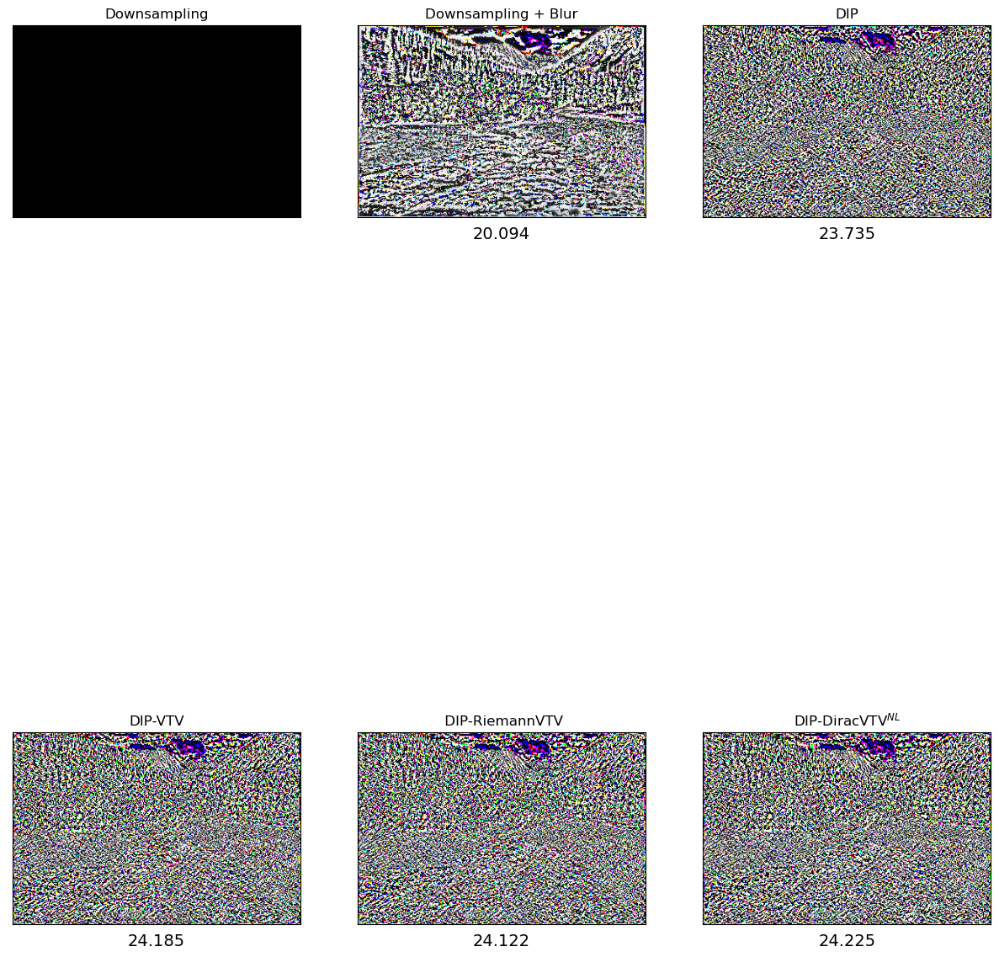

In [18]:
titulo = 'ComImgDifColor'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgDif,lsNames,lsValPSNR , 2, 3, titulo)

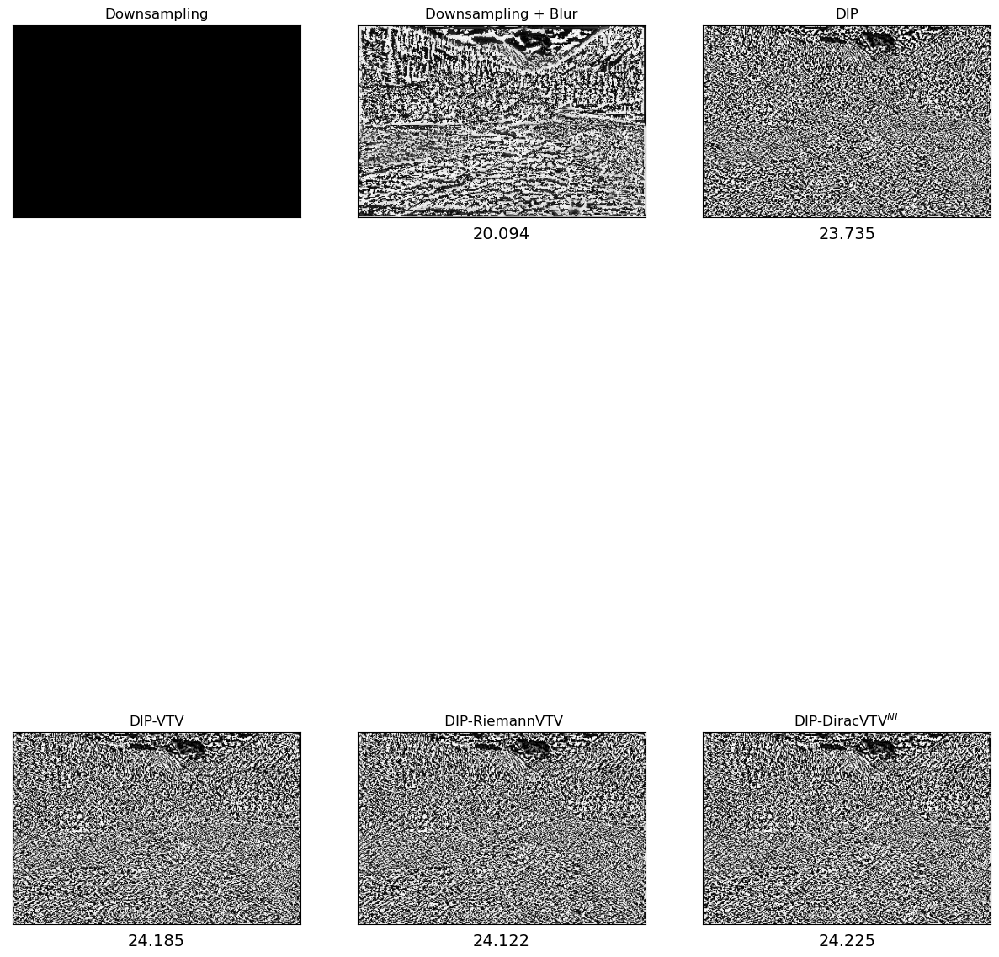

In [19]:
titulo = 'ComImgDifGris'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsGris,lsNames,lsValPSNR, 2, 3, titulo)

In [20]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [21]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.09432772056295, 23.735353665592914, 24.184756906722523, 24.122444824920983, 24.224897988355707]
24.224897988355707
5


In [22]:
(a_y,a_x) = (280,100)
(b_y,b_x) = (380,220)
(c_y,c_x) = (50,400)
(d_y,d_x) = (150,550)

In [23]:
(a_y,a_x) = (a_y//2,a_x//2)
(b_y,b_x) = (b_y//2,b_x//2) 
(c_y,c_x) = (c_y//2,c_x//2)
(d_y,d_x) = (d_y//2,d_x//2)

In [24]:
lsBestImg[0].shape

(256, 384, 3)

In [25]:
lsImgRec =[]
lscrtG =[]
lscrtR =[]

for i in range(len(lsBestImg)):
    imgRec = lsBestImg[i].copy()
    rec1 = cv2.rectangle(imgRec,(a_y,a_x),(b_y,b_x),(0,255,0),2)
    rec2 = cv2.rectangle(imgRec,(c_y,c_x),(d_y,d_x),(255,0,0),2)
    lsImgRec.append(imgRec)
    
    cort1G = imgRec[a_x+1:b_x,a_y+1:b_y,:].copy()
    lscrtG.append(cort1G)
    cort1R = imgRec[c_x+1:d_x,c_y+1:d_y,:].copy()
    lscrtR.append(cort1R)

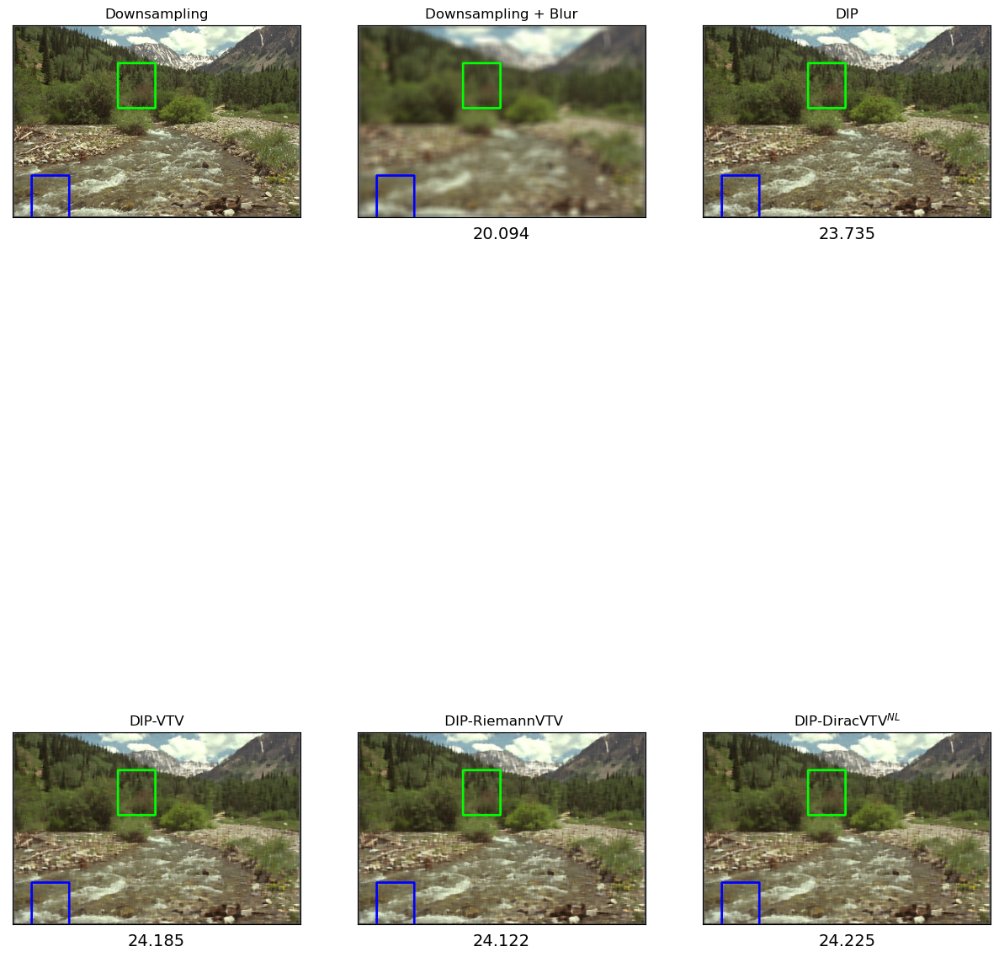

In [26]:
titulo = 'ComImgREC'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgRec,lsNames,lsValPSNR, 2, 3, titulo)

In [27]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtG[0],lscrtG[i])
    lsValPSNR.append(val)


In [28]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[27.104128797957728, 28.491058835502834, 29.035043516970322, 29.063707309869926, 29.16391114747006]
29.16391114747006
5


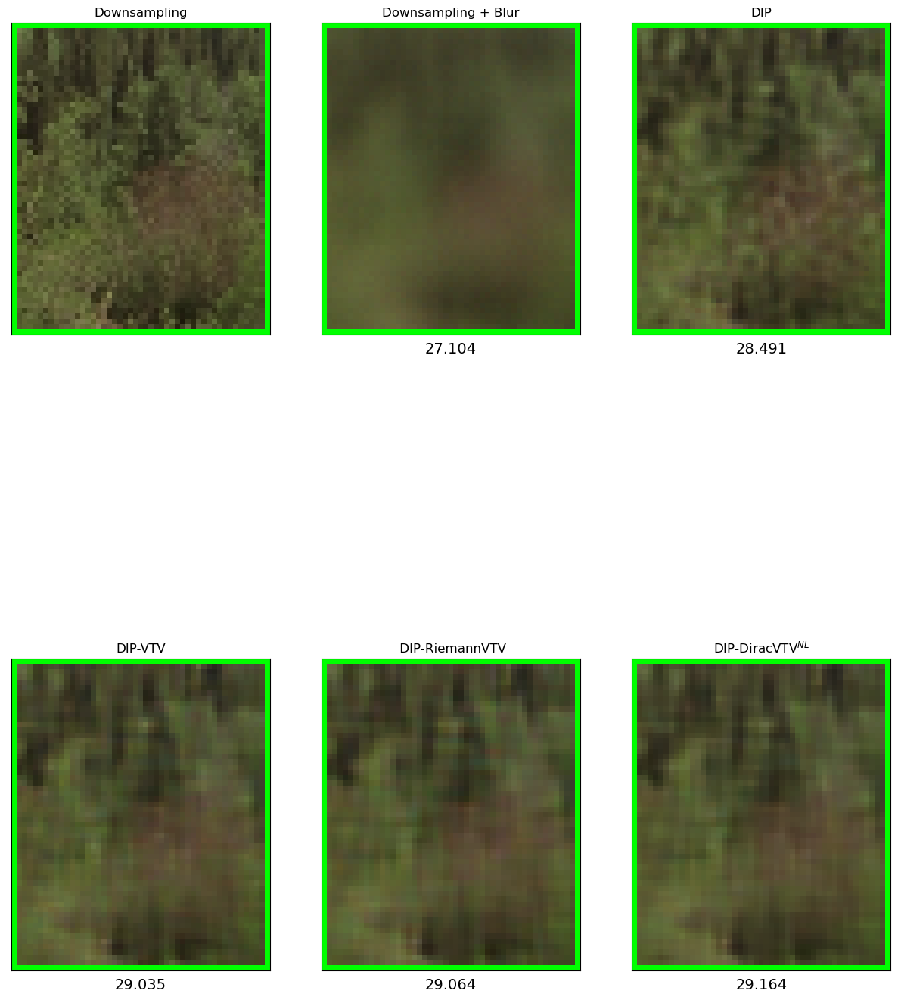

In [29]:
titulo = 'ComImgRectG'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtG,lsNames,lsValPSNR, 2, 3, titulo)

In [30]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtR[0],lscrtR[i])
    lsValPSNR.append(val)

In [31]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[22.201692349116836, 25.891202310932655, 26.576252628266076, 26.492045891946315, 26.748220051451415]
26.748220051451415
5


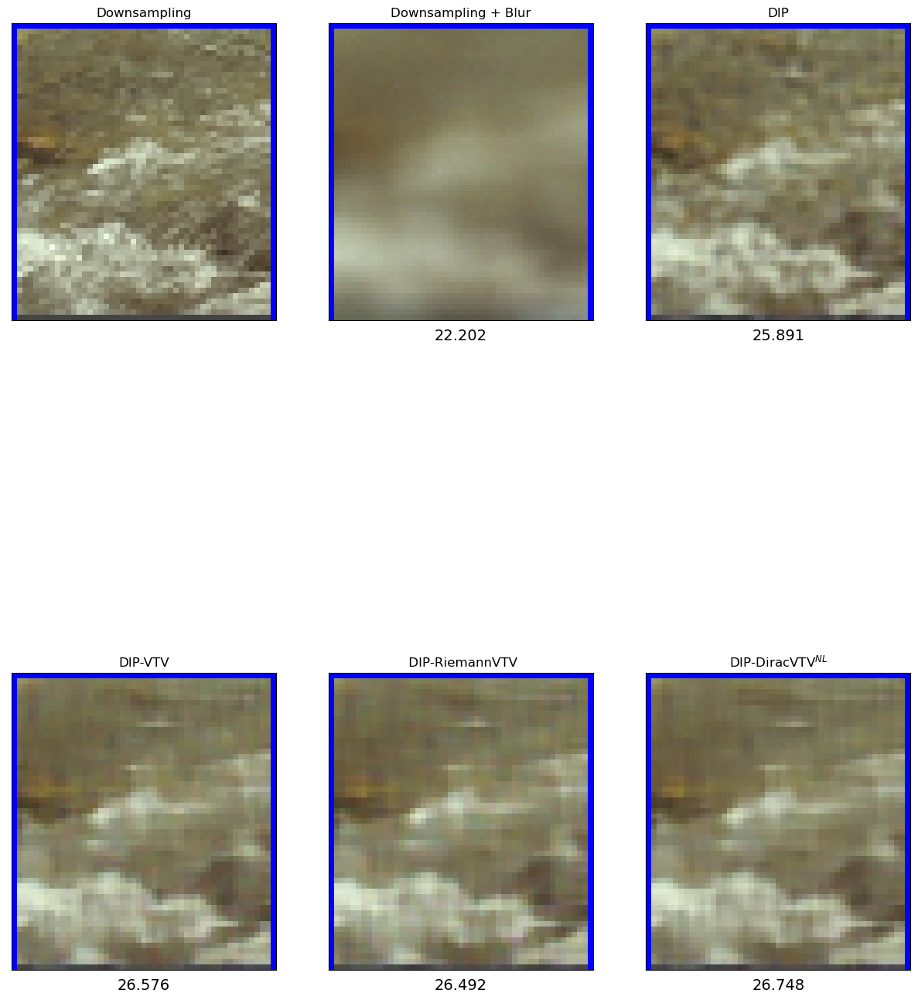

In [32]:
titulo = 'ComImgRectR'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtR,lsNames,lsValPSNR, 2, 3, titulo)

In [33]:
imgDIP = lsBestImg[2].copy()#lscrtR[2].copy()

In [34]:
imgDIP.shape

(256, 384, 3)

In [35]:
derX = imgDIP[:,:-1,:] - imgDIP[:,1:,:]
derY = imgDIP[:-1,:,:] - imgDIP[1:,:,:]

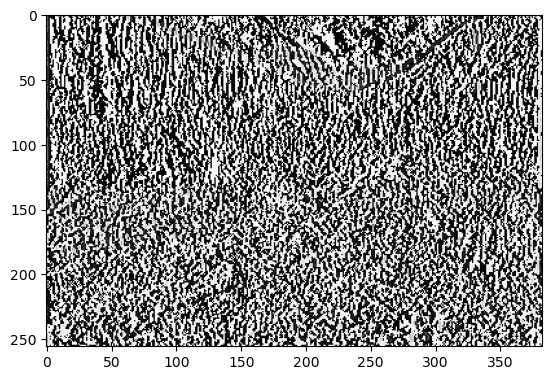

In [36]:
plt.imshow(derX[:,:,0], 'gray')

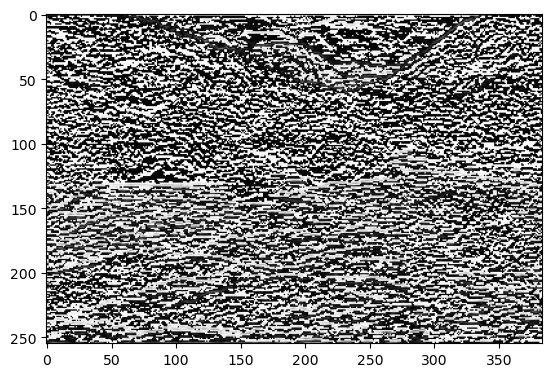

In [37]:
plt.imshow(derY[:,:,0], 'gray')

In [38]:
capa=0
i=25
j=45

(v1,v2)=(derX[i,j,capa],derY[i,j,capa])

In [39]:
(v1,v2)

(246, 2)

In [40]:
norm = np.sqrt(v1**2+v2**2)

In [41]:
(v1u,v2u) = (10*v1//norm,10*v2//norm)

In [42]:
(v1u,v2u)

(9.0, 0.0)

In [43]:
imgOut = cv2.arrowedLine(imgDIP, (i, j), (int(i+v1u), int(j+v2u)), (0, 255, 0), 1, cv2.LINE_AA)

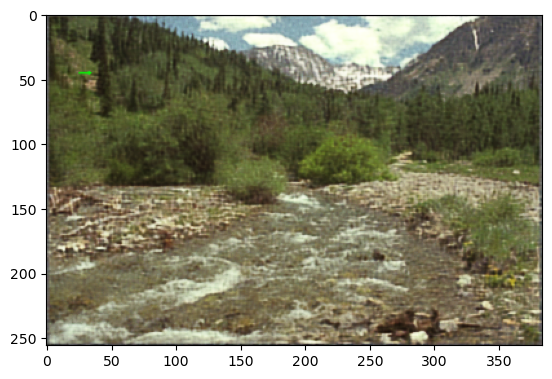

In [44]:
plt.imshow(cv2.cvtColor(imgDIP, cv2.COLOR_BGR2RGB))

In [45]:
def calcularAng(imgIN):

    color = [(255,0,0),(0,255,0),(0,0,255)]
    pares=[[0,1]]#,[0,2],[1,2]]
    
    
    imgObj = imgIN.copy()
    derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
    derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)
    
    
    ##Orillas, coincidir dimensiones
    derX=derX[1:-1,:-1,:]
    derY=derY[:-1,1:-1,:]
    n,m,C = np.shape(derX)
    print('shape',n,m,C)
    
    normT = np.sqrt(derX**2 + derY**2)
    
    #Calcular productos
    prodBG = derX[:,:,0]*derX[:,:,1] + derY[:,:,0]*derY[:,:,1]
    prodBR = derX[:,:,0]*derX[:,:,2] + derY[:,:,0]*derY[:,:,2]
    prodGR = derX[:,:,1]*derX[:,:,2] + derY[:,:,1]*derY[:,:,2]
    
    #Calcular normas
    normBG = normT[:,:,0]*normT[:,:,1]
    normBR = normT[:,:,0]*normT[:,:,2]
    normGR = normT[:,:,1]*normT[:,:,2]
    
    lsProd = [prodBG,prodBR,prodGR]
    lsNorm = [normBG,normBR,normGR]
    
    cout=0
    ban=0
    
    imgANG= np.zeros((n,m))
    true=0
    for i in range(n):
        for j in range(m):
            
            lsAng=[]
            promPX=0
            
            #Angulos de cada canal
            for k in range(C):
                matProd=lsProd[k]
                prod = matProd[i][j]
                matNorm = lsNorm[k]
                norm = matNorm[i][j]
                #print('norm=',norm)           
                
                if(norm!=0):
                    arg = prod/norm
                    
                    if(abs(arg)>=1):
                        ang=0
                        #print('ang0',ang)
                    else:
                        ang=math.acos(arg)
                        #if(ban==1):
                            #print('arg',arg)
                            #print('angAcos',ang)
                            #ban=0
                    #if(prod<0):#Angulo obtuso
                        #cout+=1
                        #print('prod ij',prod,i,j)
                        #ban=1
                        #ang=np.pi-ang
                    #print('ang',ang)
                else:
                    ang=0
                    
                promPX+=ang
            
            promPX=np.mean(promPX)
            #print('promPX',promPX)
            
            imgANG[i][j]=promPX
    
    #print('contador',cout)
    #print('true',true)
    
    return imgANG

In [46]:
imgANG = calcularAng(lscrtG[0])

shape 57 47 3


In [47]:
imgANG

array([[0.        , 5.83637996, 5.95489302, ..., 5.58326964, 4.66303233,
        5.26541687],
       [5.89386779, 0.54889717, 0.34649133, ..., 0.22850866, 0.51036478,
        3.14159265],
       [6.25615993, 0.64350111, 0.12229633, ..., 0.05534919, 0.5590443 ,
        0.21347135],
       ...,
       [6.03211831, 0.09199283, 0.12373569, ..., 0.80978357, 0.19716103,
        0.43733789],
       [6.21190772, 1.00133545, 0.44234727, ..., 0.11099701, 0.15965997,
        5.35589009],
       [6.13138202, 1.57079633, 0.11751167, ..., 1.85459046, 0.33029735,
        0.39479112]])

In [48]:
imgANG[0,:]

array([0.        , 5.83637996, 5.95489302, 4.73828468, 5.96286053,
       5.6538753 , 5.49528938, 5.77632718, 6.06944246, 5.9016742 ,
       6.00466128, 5.45301484, 5.87212465, 5.98270432, 6.11681381,
       6.00822683, 6.15525709, 5.92958686, 6.12473313, 5.39607772,
       6.28163991, 6.19151594, 5.9393717 , 6.01586529, 5.95614952,
       5.96655878, 5.74485032, 5.82389442, 5.73013924, 5.57562895,
       6.27292899, 5.59519686, 5.5671666 , 5.93194984, 6.08934601,
       5.20668997, 6.16791826, 5.82739844, 3.14159265, 5.50867124,
       6.16289993, 5.80181162, 6.02428989, 6.05507741, 5.58326964,
       4.66303233, 5.26541687])

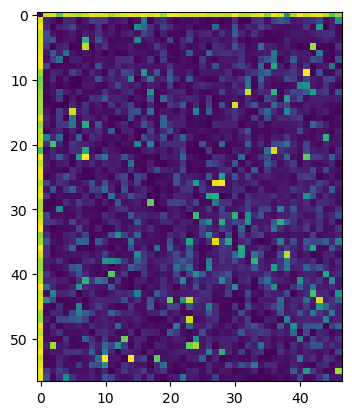

In [49]:
plt.imshow(imgANG)#,'gray')

In [50]:
np.mean(imgANG)

0.9152542736852097

shape 254 382 3
shape 254 382 3
shape 254 382 3
shape 254 382 3
shape 254 382 3
shape 254 382 3


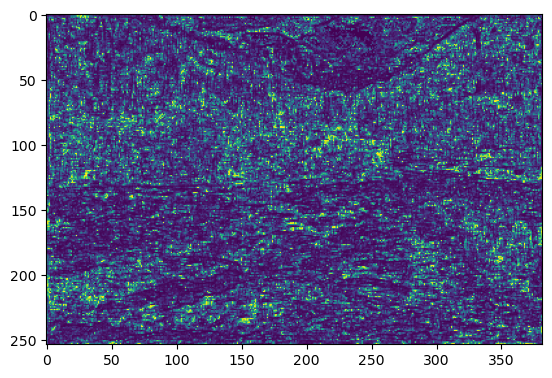

In [51]:
lsImgAng=[]
lsAngProm=[]

for img in lsBestImg:#lscrtG:
    imgOut = calcularAng(img)
    lsImgAng.append(imgOut)
    prom=np.mean(imgOut)
    lsAngProm.append(prom)
    plt.imshow(imgOut)

In [52]:
lsAngProm

[0.6034351976652699,
 2.559306327274281,
 1.175350824292049,
 1.7579242813735108,
 1.7719189291376423,
 1.306239621520755]

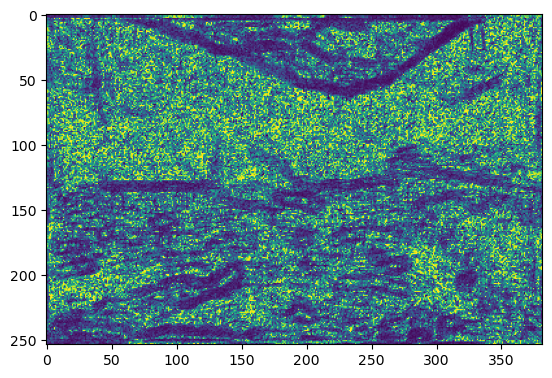

In [53]:
plt.imshow(lsImgAng[1])

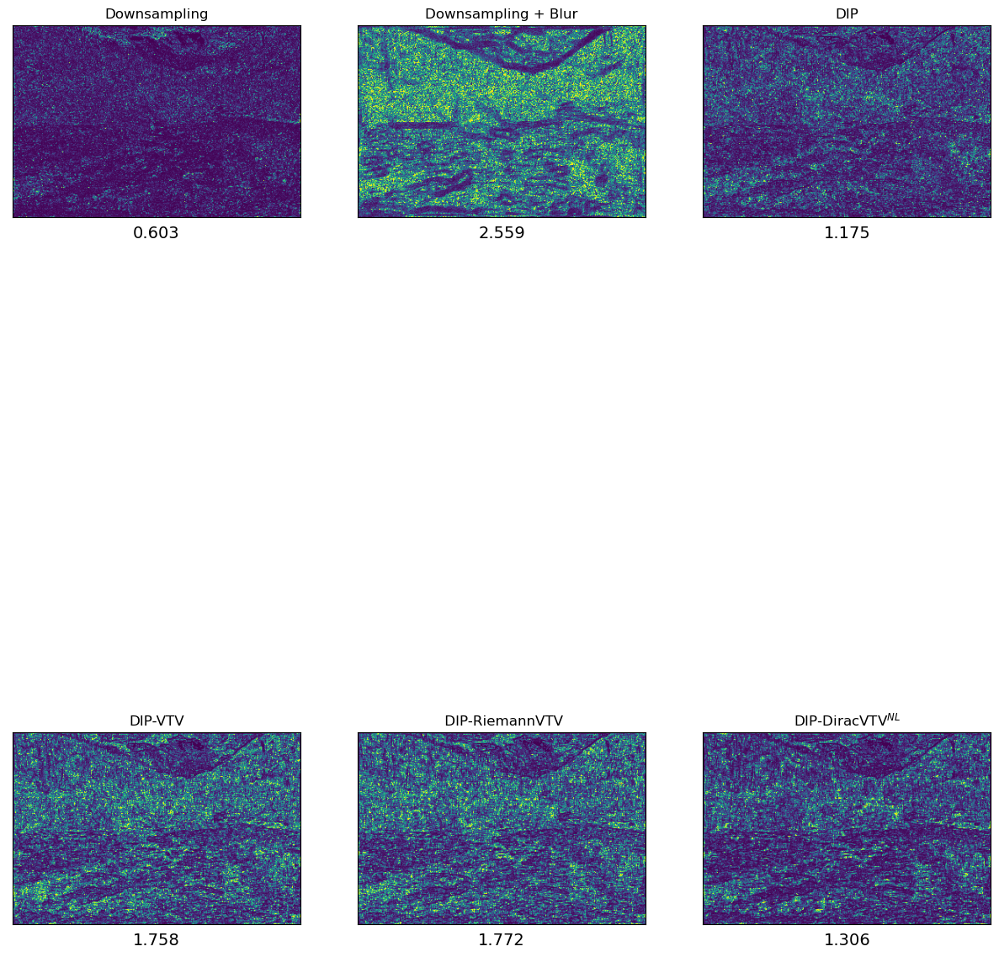

In [54]:
titulo = 'ImgAng'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printAng(lsImgAng,lsNames,lsAngProm, 2, 3, titulo)

In [55]:
#lsBestImg = lsImgVec.copy()

In [56]:
#PUNTO
#i=163
#j=120

i=321
j=48

def printVect(i,j,lsBestImg):
    lsImgVec = []

    color = [(255,0,0),(0,255,0),(0,0,255)]
    fact=50

    for imgParche in lsBestImg:

        imgObj = imgParche.copy()
        derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
        derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)

        for k in range(3):
            capa = k

            (v1,v2) = (derX[i,j,capa],derY[i,j,capa])
            norm = np.sqrt(v1**2+v2**2)
            if norm!=0:
                (v1u,v2u) = (fact*v1//norm,fact*v2//norm)
            else:
                (v1u,v2u) = (fact*v1,fact*v2)
            imgOut = cv2.arrowedLine(imgObj, (j,i), (int(j+v2u),int(i+v1u)), color[k], 2,  cv2.LINE_AA)#, 0, 0.5)#cv2.LINE_4)#
            print((i, j), (int(i+v1u), int(j+v2u)))

        lsImgVec.append(imgObj)
    return lsImgVec

In [57]:
lsImgVec = printVect(163,120,lsBestImg)

(163, 120) (162, 70)
(163, 120) (165, 70)
(163, 120) (163, 70)
(163, 120) (180, 166)
(163, 120) (191, 160)
(163, 120) (198, 155)
(163, 120) (178, 72)
(163, 120) (180, 73)
(163, 120) (186, 75)
(163, 120) (169, 70)
(163, 120) (172, 71)
(163, 120) (184, 74)
(163, 120) (170, 70)
(163, 120) (175, 71)
(163, 120) (179, 72)
(163, 120) (167, 70)
(163, 120) (169, 70)
(163, 120) (181, 73)


In [58]:
lsImgVec = lsBestImg.copy()
n,m,C = np.shape(lsImgVec[0])

In [59]:
import random
DICT = [(163,120),(196, 62),(231, 196), (291, 156)]#,(284,101), (144, 296)
#[(231, 196), (67, 71), (291, 156), (14, 63), (194, 174), (281, 59),(145, 139)]
ls = []
for i in range(6):
    x = random.randint(0, n-1)
    y = random.randint(0, m-1)
    ls.append((x,y))
print(ls)
for (x,y) in ls: #ls:#  
    lsImgVec = printVect(x,y,lsImgVec)

[(137, 381), (240, 10), (33, 261), (61, 203), (189, 352), (97, 224)]
(137, 381) (135, 331)
(137, 381) (144, 331)
(137, 381) (149, 332)
(137, 381) (183, 362)
(137, 381) (185, 370)
(137, 381) (186, 373)
(137, 381) (176, 350)
(137, 381) (181, 357)
(137, 381) (182, 359)
(137, 381) (161, 337)
(137, 381) (181, 358)
(137, 381) (176, 350)
(137, 381) (164, 339)
(137, 381) (178, 352)
(137, 381) (174, 347)
(137, 381) (165, 339)
(137, 381) (176, 350)
(137, 381) (178, 352)
(240, 10) (200, -21)
(240, 10) (200, -21)
(240, 10) (198, -18)
(240, 10) (198, -18)
(240, 10) (193, -9)
(240, 10) (193, -9)
(240, 10) (244, -40)
(240, 10) (244, -40)
(240, 10) (260, -36)
(240, 10) (255, -38)
(240, 10) (275, -26)
(240, 10) (240, 60)
(240, 10) (290, 10)
(240, 10) (262, -35)
(240, 10) (281, -18)
(240, 10) (289, 18)
(240, 10) (287, 25)
(240, 10) (281, 37)
(33, 261) (17, 213)
(33, 261) (83, 261)
(33, 261) (33, 261)
(33, 261) (83, 261)
(33, 261) (-3, 296)
(33, 261) (55, 305)
(33, 261) (33, 311)
(33, 261) (28, 310)
(33,

In [60]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [61]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.09432772056295, 23.735353665592914, 24.184756906722523, 24.122444824920983, 24.224897988355707]
24.224897988355707
5


In [62]:
#Original imagen Grande con vectores
#namefig = 'GradidentesImagenOrg19.png'
#imgOut = cv2.imread(namefig)

In [63]:
#lsImg34 = [imgOut,imgOut] + lsImgVec

In [64]:
#lsValPSNR2 = [0,0] + lsValPSNR
#lsValPSNR2

NameError: name 'lsValPSNR2' is not defined

In [65]:
#lsNames2 = ['-','Original','Downsampling','Downsampling + Blur','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

lsNames2 = ['Downsampling','Downsampling + Blur','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

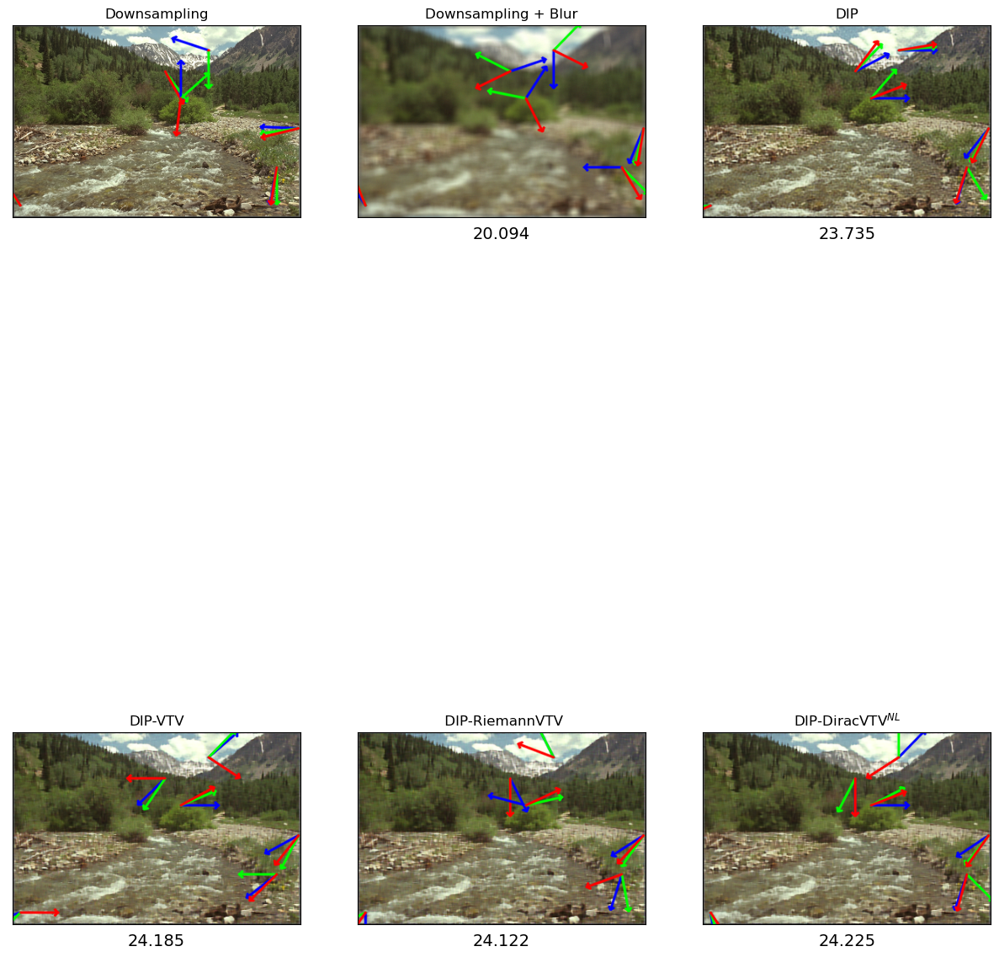

In [66]:
titulo = 'ComImgVect'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lsImgVec,lsNames2,lsValPSNR, 2, 3, titulo)
#printImgs(lsImg34,lsNames2,lsValPSNR2, 2, 4, titulo,2)


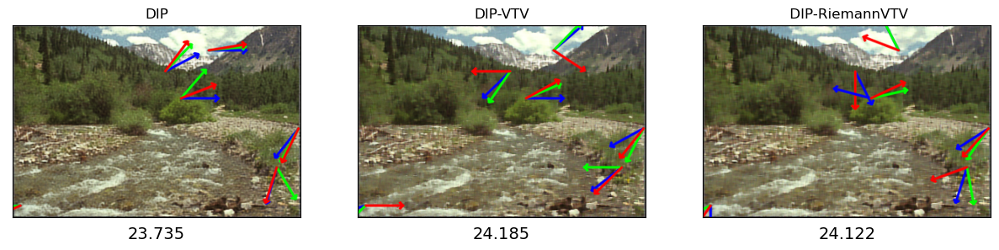

In [67]:
titulo = 'ComImgVectRedu'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 3, titulo,-1)

In [68]:
lsBestImg[0].shape

(256, 384, 3)

In [ ]:
derX.shape

In [ ]:
lsImgVec